# Diffuser 使用介紹
[Diffuser](https://github.com/huggingface/diffusers)



https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/diffusers_intro.ipynb#scrollTo=TI04XgY5DPeE

![](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusion-process.png)

![](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/unet-model.png)

這邊我先放上後面要顯示圖片的程式碼

In [1]:
from diffusers.utils import make_image_grid
import PIL.Image
import numpy as np

# torch.manual_seed(1234)

def display_sample(sample, i):
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)
    image_pil = PIL.Image.fromarray(image_processed[0])    
    display(f"Image at step {i}")
    display(image_pil)

def display_sample2(sample,sample2, i):
    images=[]
    image_processed = sample.cpu().permute(0, 2, 3, 1)
    image_processed = (image_processed + 1.0) * 127.5
    image_processed = image_processed.numpy().astype(np.uint8)
    image_pil1 = PIL.Image.fromarray(image_processed[0])

    image_processed2 = sample2.cpu().permute(0, 2, 3, 1)
    image_processed2 = (image_processed2 + 1.0) * 127.5
    image_processed2 = image_processed2.numpy().astype(np.uint8)
    image_pil2 = PIL.Image.fromarray(image_processed2[0])
    images=[image_pil1, image_pil2]
    display(f"Image at step {i}")
    display(make_image_grid(images, rows=1, cols=2))
    



# Denoising Diffusion Probabilistic Models (DDPM) algorithm trained on a dataset of celebrities images
我們使用`google/ddpm-celebahq-256`當作操作範例<br>
`google/ddpm-celebahq-256`是由Google and U.C.Berkeley共同完成的模型<br>

模型是從資料集Large-scale CelebFaces Attributes (CelebA) Dataset訓練來的<br>
資料可以從[官方網站](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)或是[kaggle](https://www.kaggle.com/datasets/jessicali9530/celeba-dataset)下載。<br>

我們採用`DDPMPipeline`來執行模型，使用打包好的模組幾行就能生成圖片。


In [2]:
from diffusers import DDPMPipeline
image_pipe = DDPMPipeline.from_pretrained("google/ddpm-celebahq-256")
image_pipe.to("cuda")



import error: No module named 'triton'


Loading pipeline components...:   0%|          | 0/2 [00:00<?, ?it/s]

An error occurred while trying to fetch C:\Users\glanb\.cache\huggingface\hub\models--google--ddpm-celebahq-256\snapshots\cd5c944777ea2668051904ead6cc120739b86c4d: Error no file named diffusion_pytorch_model.safetensors found in directory C:\Users\glanb\.cache\huggingface\hub\models--google--ddpm-celebahq-256\snapshots\cd5c944777ea2668051904ead6cc120739b86c4d.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


DDPMPipeline {
  "_class_name": "DDPMPipeline",
  "_diffusers_version": "0.32.2",
  "_name_or_path": "google/ddpm-celebahq-256",
  "scheduler": [
    "diffusers",
    "DDPMScheduler"
  ],
  "unet": [
    "diffusers",
    "UNet2DModel"
  ]
}

In [3]:
images = image_pipe().images

  0%|          | 0/1000 [00:00<?, ?it/s]

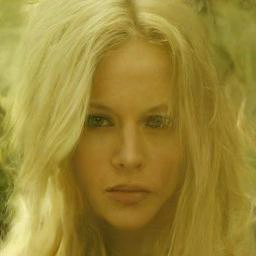

In [4]:
images[0]

上述是很簡易的操作方式，但和DDPM中逐步(timestep)去除雜訊(noisy sample)過程看不出個所以然。<br>
我們以一個簡易的unconditional image generation model (type:UNet2DModel)<br>
下面程式範例from_pretrained()會自動將權重下載到local端→模型是PyTorch torch.nn.Module class。<br>


In [5]:
from diffusers import UNet2DModel

repo_id = "google/ddpm-celebahq-256" # `google/ddpm-church-256`
model = UNet2DModel.from_pretrained(repo_id)
model

An error occurred while trying to fetch google/ddpm-celebahq-256: google/ddpm-celebahq-256 does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


UNet2DModel(
  (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=128, out_features=512, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=512, out_features=512, bias=True)
  )
  (down_blocks): ModuleList(
    (0-1): 2 x DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
          (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=512, out_features=128, bias=True)
          (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Con

In [6]:
model.config

FrozenDict([('sample_size', 256),
            ('in_channels', 3),
            ('out_channels', 3),
            ('center_input_sample', False),
            ('time_embedding_type', 'positional'),
            ('time_embedding_dim', None),
            ('freq_shift', 1),
            ('flip_sin_to_cos', False),
            ('down_block_types',
             ['DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'DownBlock2D',
              'AttnDownBlock2D',
              'DownBlock2D']),
            ('up_block_types',
             ['UpBlock2D',
              'AttnUpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D',
              'UpBlock2D']),
            ('block_out_channels', [128, 128, 256, 256, 512, 512]),
            ('layers_per_block', 2),
            ('mid_block_scale_factor', 1),
            ('downsample_padding', 0),
            ('downsample_type', 'conv'),
            ('upsample_type', 'conv'),
            ('


- `sample_size`: 輸入圖片的高和寬。
- `in_channels`: 輸入圖片的channel數。
- `down_block_types` and `up_block_types`: 在UNet中下採樣(Downsamping)和上採樣(Upsampling)的定義，和前面圖片呼應。



我們可以用同樣的設定初始化一個隨機權重UNet透過前面讀進來的`model.config`<br>
如果要儲存模型直接用'save_pretrained()'的方式就可以將`模型權重`和`模型config`儲存

In [7]:
model_random = UNet2DModel(**model.config)
model_random.save_pretrained("my_model")

如果要讀取`my_model`，只需要利用from_pretrained()即可。

In [8]:
model_random = UNet2DModel.from_pretrained("my_model")

我們這邊先寫一個亂數(Gaussian)產生器，生成的大小是<br>
$$
batch\_size \times in\_channels \times sample\_size \times sample\_size
$$

```
Gaussian亂數 = 常態分布
```

In [9]:
import torch

torch.manual_seed(0)

noisy_sample = torch.randn(
    1, model.config.in_channels, model.config.sample_size, model.config.sample_size
)
noisy_sample.shape

torch.Size([1, 3, 256, 256])

```
Gaussian亂數 = 常態分布
```
常態分佈產生的資料也可以稱為白噪音(white noise)<br>
白噪音的特性是 $X\sim N(0,\mathcal{E})$，最大的特點是...白噪音的期望值(平均數)為0。

mean:-0.0029676235280930996, std:1.000355839729309
mean:-0.00516464514657855, std:1.000533938407898
mean:-0.0008618320571258664, std:1.0015952587127686


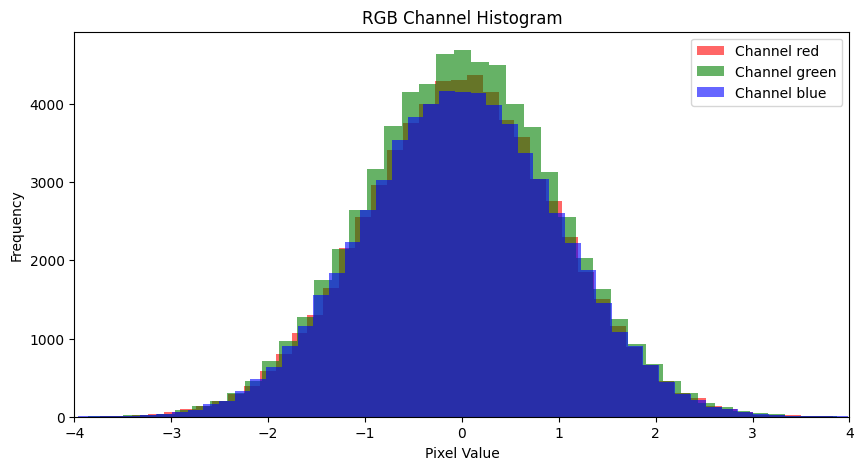

In [10]:
import matplotlib.pyplot as plt

noisy_sample = torch.randn(1, 3, 256, 256)  # 1 張 RGB 影像，值範圍 [0,1]
noisy_sample = noisy_sample.squeeze(0)  # 去掉 batch 維度
# 畫直方圖
colors = ['red', 'green', 'blue']
plt.figure(figsize=(10, 5))
for i, color in enumerate(colors):
    plt.hist(noisy_sample[i].flatten(), bins=50, alpha=0.6, color=color, label=f'Channel {color}')
    print('mean:{}, std:{}'.format(torch.mean(noisy_sample[i].flatten()), torch.std(noisy_sample[i].flatten())))

plt.xlim([-4,4])
plt.legend()
plt.title("RGB Channel Histogram")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.show()

mean:-0.0005162625457160175, std:0.09996943175792694
mean:1.8866969185182825e-05, std:0.0999893769621849
mean:-1.4557954273186624e-06, std:0.10010185837745667


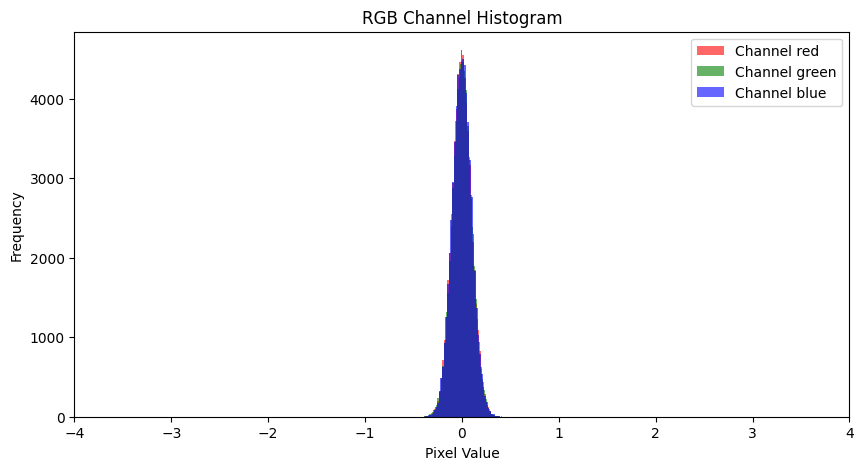

mean:-0.0002850612218026072, std:0.10007014125585556
mean:-0.00040650562732480466, std:0.09974980354309082
mean:-1.6840800526551902e-05, std:0.09965981543064117


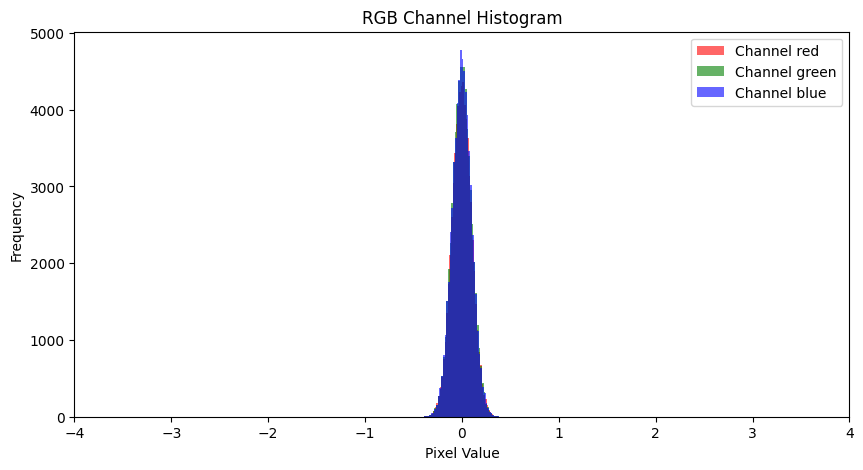

mean:0.00011503428686410189, std:0.0997823178768158
mean:-0.00010828961967490613, std:0.09998394548892975
mean:-0.00011295132571831346, std:0.0999450609087944


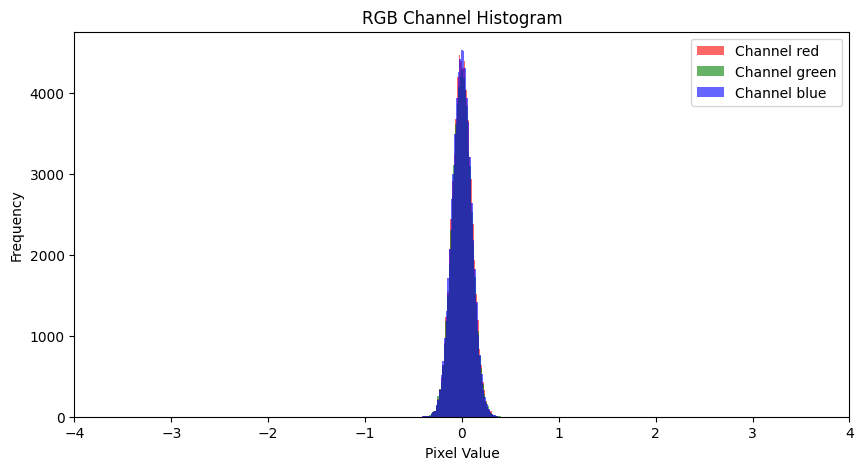

In [11]:
for samplesizs in [5, 500, 5000]:
    noisy_samples = torch.randn(
        100, model.config.in_channels, model.config.sample_size, model.config.sample_size
    )
    noisy_sample=torch.mean(noisy_samples,0)

    # 畫直方圖
    colors = ['red', 'green', 'blue']
    plt.figure(figsize=(10, 5))
    for i, color in enumerate(colors):
        plt.hist(noisy_sample[i].flatten(), bins=50, alpha=0.6, color=color, label=f'Channel {color}')
        print('mean:{}, std:{}'.format(torch.mean(noisy_sample[i].flatten()), torch.std(noisy_sample[i].flatten())))
    plt.xlim([-4,4])
    plt.legend()
    plt.title("RGB Channel Histogram")
    plt.xlabel("Pixel Value")
    plt.ylabel("Frequency")
    plt.show()

# 逐步推理
在Diffuse模型的decode下，會將雜訊樣本逐步(步長)還原<br>
一開始的輸入給模型的的雜訊樣本，雜訊比較大<br>
透過Diffuse雜訊會越來越小，最後呈現出沒有雜訊的生成圖。<br>
![](https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusion-process.png)
$$
Z_0→Z_1→...→Z_{t-1}→Z_{t}
$$

模型在解碼(decode)的過程，是逐步減少noise
1. 輸入隨機產生的雜訊樣本($Z_0$)
2. 模型預測殘差($r_0$): 模型會預測此雜訊樣本($Z_0$)跟下一步影像($Z_1$)的殘差值(residual，$r_0$)→雜訊略少的影像與輸入影像之間的差異
3. 更新$Z_1$ : 藉由殘差值算出少一點雜訊的圖片 ($Z_1 = Z_1 - r_0$)
4. 模型預測殘差($r_1$): 然後再輸入到模型會預測跟下一步影像($Z_2$)的殘差值($r_1$)
5. repeat，直到$Z_t$


In [12]:
import torch
torch.manual_seed(0)
noisy_sample = torch.randn(
    1, model.config.in_channels, model.config.sample_size, model.config.sample_size
)
model.eval()
with torch.no_grad():
    noisy_residual = model(sample=noisy_sample, timestep=2).sample
noisy_residual.shape

torch.Size([1, 3, 256, 256])

# Schedulers
Schedulers定義了noise的排成，如何在訓練加入noise，也定義出如何計算出殘差(residual)(`noisy_residual`)<br>
我們在此著重在inference階段的使用。<br>
Schedulers是一個沒有權重的只單純定義模型怎麼算出slightly less noisy sample，所以沒有繼承torch.nn.Module。<br>
不同的Schedulers定義不同，可以從[diffuser的github](https://github.com/huggingface/diffusers/tree/main/src/diffusers/schedulers)查看。<br>

In [13]:
from diffusers import DDPMScheduler

scheduler = DDPMScheduler.from_config(repo_id)
scheduler

c:\Users\glanb\anaconda3\Lib\site-packages\diffusers\configuration_utils.py:245: FutureWarning: It is deprecated to pass a pretrained model name or path to `from_config`.If you were trying to load a scheduler, please use <class 'diffusers.schedulers.scheduling_ddpm.DDPMScheduler'>.from_pretrained(...) instead. Otherwise, please make sure to pass a configuration dictionary instead. This functionality will be removed in v1.0.0.
  deprecate("config-passed-as-path", "1.0.0", deprecation_message, standard_warn=False)


DDPMScheduler {
  "_class_name": "DDPMScheduler",
  "_diffusers_version": "0.32.2",
  "beta_end": 0.02,
  "beta_schedule": "linear",
  "beta_start": 0.0001,
  "clip_sample": true,
  "clip_sample_range": 1.0,
  "dynamic_thresholding_ratio": 0.995,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "rescale_betas_zero_snr": false,
  "sample_max_value": 1.0,
  "steps_offset": 0,
  "thresholding": false,
  "timestep_spacing": "leading",
  "trained_betas": null,
  "variance_type": "fixed_small"
}

主要重點在:
- `num_train_timesteps`: 此步驟定義了在訓練過程中加入雜訊的總步數(t)，也代表我們在還原denoise的程序要多少步。
- `beta_schedule`: 此步驟代表在訓練和推理過程中，加入noise程序方式。
- `beta_start` 和 `beta_end`: 代表在schedule過程中的最小雜訊和最大雜訊。


假設
- num_train_timesteps:10 
- beta_schedule: "linear"
- beta_end: 1
- beta_start: 0

beta變化<br>
0 → 0.1 → 0.2 → 0.3 → 0.4 → 0.5 → 0.6 → 0.7 → 0.8 → 0.9 → 1



In [14]:
scheduler.save_config("my_scheduler")
new_scheduler = DDPMScheduler.from_config("my_scheduler")

開始decode產生圖吧

 10%|▉         | 97/1000 [00:05<00:41, 21.91it/s]

'Image at step 100'

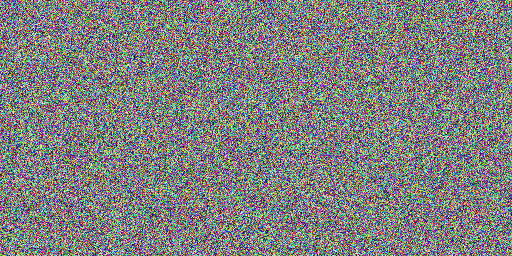

 20%|█▉        | 199/1000 [00:09<00:34, 23.46it/s]

'Image at step 200'

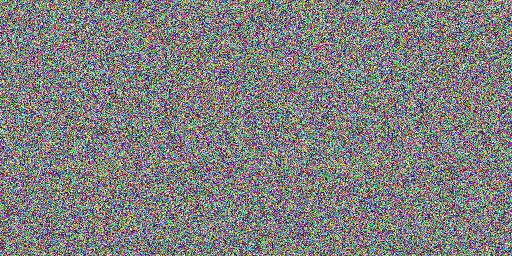

 30%|██▉       | 298/1000 [00:14<00:31, 22.19it/s]

'Image at step 300'

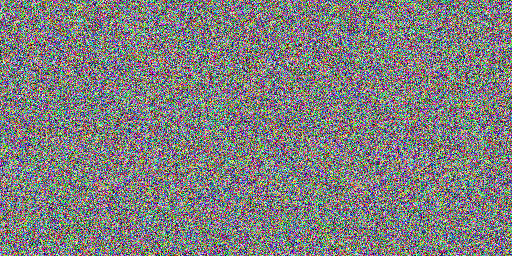

 40%|███▉      | 397/1000 [00:18<00:25, 23.42it/s]

'Image at step 400'

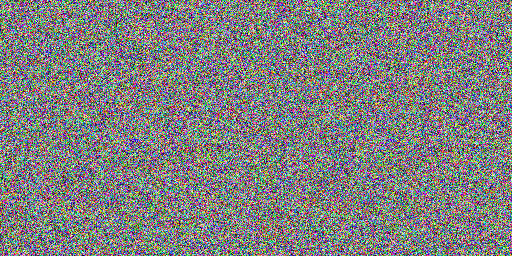

 50%|████▉     | 499/1000 [00:23<00:24, 20.33it/s]

'Image at step 500'

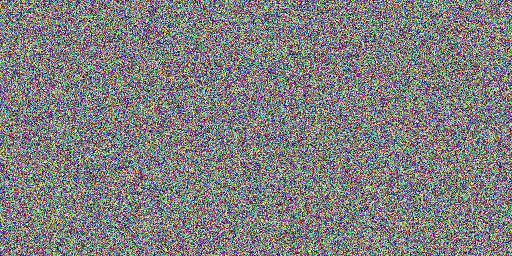

 60%|█████▉    | 599/1000 [00:28<00:18, 21.85it/s]

'Image at step 600'

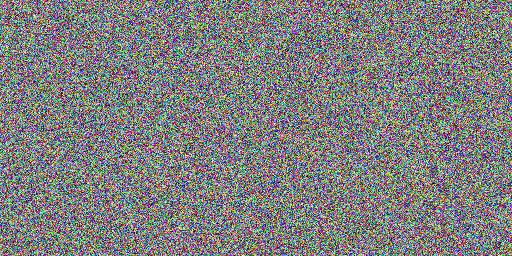

 70%|██████▉   | 698/1000 [00:33<00:13, 21.73it/s]

'Image at step 700'

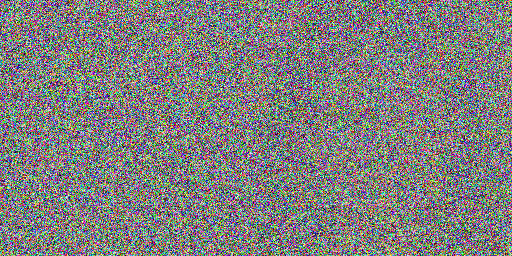

 80%|███████▉  | 797/1000 [00:37<00:10, 19.99it/s]

'Image at step 800'

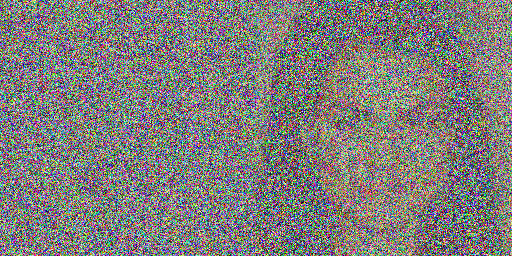

 90%|████████▉ | 899/1000 [00:42<00:04, 21.07it/s]

'Image at step 900'

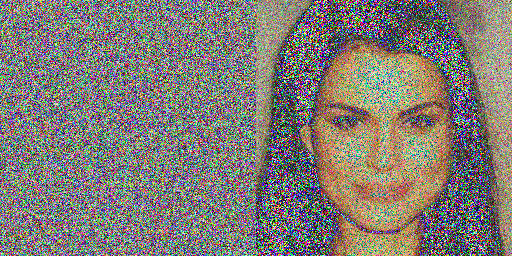

100%|█████████▉| 997/1000 [00:47<00:00, 21.11it/s]

'Image at step 1000'

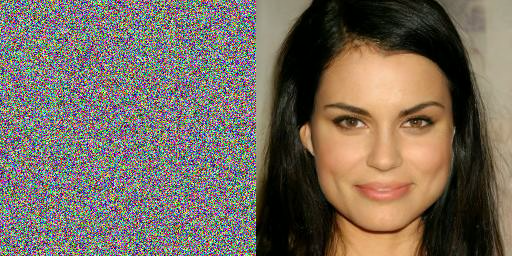

100%|██████████| 1000/1000 [00:47<00:00, 20.97it/s]


In [15]:
import tqdm

model.to("cuda")
noisy_sample = noisy_sample.to("cuda")

sample = noisy_sample
for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
  with torch.no_grad():
      residual = model(sample, t).sample # 1. predict noise residual
  sample = scheduler.step(residual, t, sample).prev_sample # 2. compute less noisy image and set x_t -> x_t-1
  if (i + 1) % 100 == 0:
      display_sample2(residual, sample, i+1) # 3. optionally look at image

# 程式全部串一起
模型改成生成貓咪
`repo_id = "google/ddpm-cat-256"`

 10%|▉         | 99/1000 [00:04<00:38, 23.43it/s]

'Image at step 100'

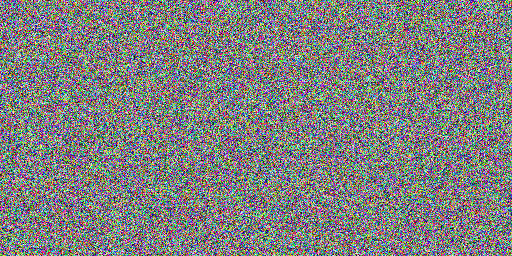

 20%|█▉        | 198/1000 [00:09<00:38, 20.72it/s]

'Image at step 200'

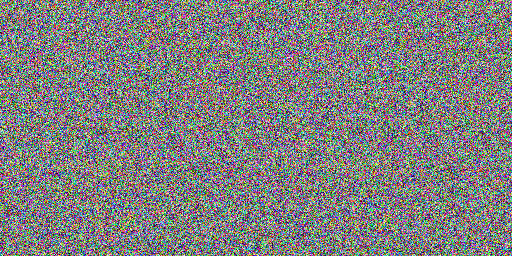

 30%|██▉       | 299/1000 [00:14<00:42, 16.50it/s]

'Image at step 300'

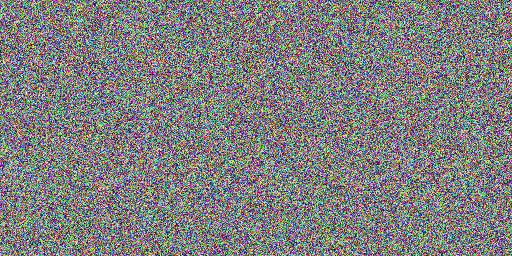

 40%|███▉      | 399/1000 [00:19<00:25, 23.63it/s]

'Image at step 400'

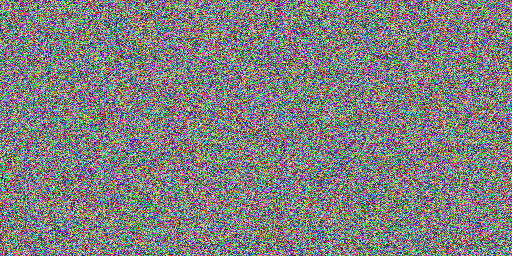

 50%|████▉     | 498/1000 [00:23<00:20, 24.01it/s]

'Image at step 500'

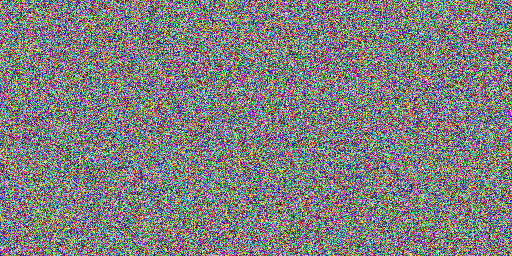

 60%|█████▉    | 597/1000 [00:27<00:17, 23.29it/s]

'Image at step 600'

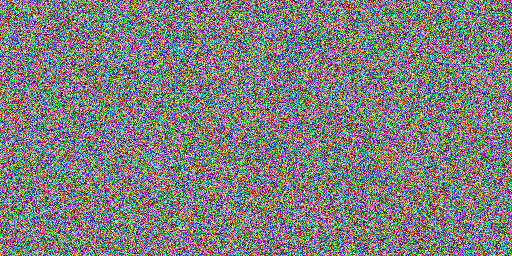

 70%|██████▉   | 699/1000 [00:32<00:14, 20.69it/s]

'Image at step 700'

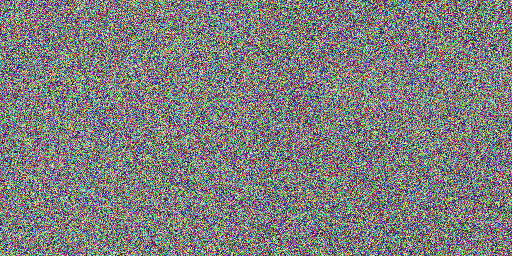

 80%|███████▉  | 797/1000 [00:38<00:09, 20.59it/s]

'Image at step 800'

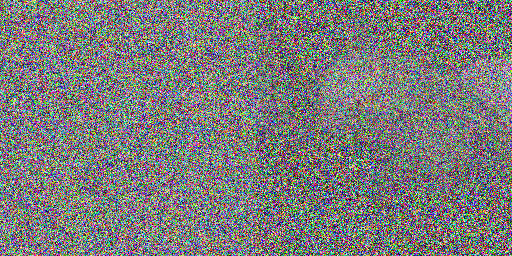

 90%|████████▉ | 899/1000 [00:43<00:05, 17.56it/s]

'Image at step 900'

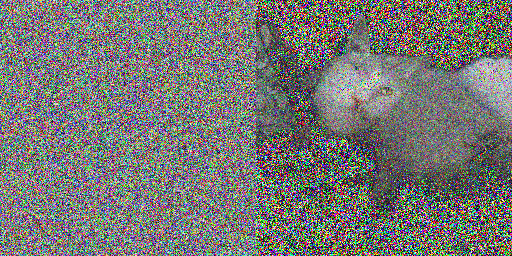

100%|█████████▉| 998/1000 [00:48<00:00, 18.81it/s]

'Image at step 1000'

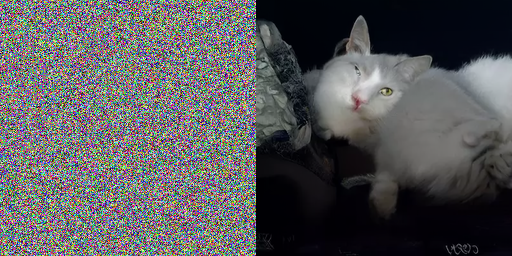

100%|██████████| 1000/1000 [00:48<00:00, 20.49it/s]


In [16]:

from diffusers import UNet2DModel
from diffusers import DDPMScheduler
import torch
import tqdm
torch.manual_seed(0)

repo_id = "google/ddpm-cat-256"
model = UNet2DModel.from_pretrained(repo_id).to("cuda")
scheduler = DDPMScheduler.from_config(repo_id)
sample = torch.randn(1, model.config.in_channels, model.config.sample_size, model.config.sample_size).to("cuda")
for i, t in enumerate(tqdm.tqdm(scheduler.timesteps)):
    with torch.no_grad():
        residual = model(sample, t).sample# 1. predict noise residual
    sample = scheduler.step(residual, t, sample).prev_sample# 2. compute less noisy image and set x_t -> x_t-1
    if (i+1) % 100 == 0:
        display_sample2(residual, sample, i+1)
    

